# embedding topology analysis

Use the observed loop/parallel trajectories in ENS of gut_dev_Huycke dataset.  

In [1]:
%load_ext autoreload
%autoreload 2

# Basic setup

In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'DejaVu Sans',
}

# mpl.rcParams['svg.fonttype'] = 'none'
# mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "gut_dev_Huycke"
file_name = "gut_dev_Huycke_Jul17-1902"
file_suffix = time.strftime('%b%d-%H%M')

# save_dir = Path(f"../save/{proj_name}-{file_suffix}")
# save_dir.mkdir(parents=True, exist_ok=True)
save_dir = Path(f"../save/{proj_name}-Aug04-0015")

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

In [4]:
# load the data
adata = sc.read_h5ad(data_dir / f"{file_name}_final.h5ad")

In [5]:
# Define color palette for broad_cell_type
_, _, celltype_pal = ccd.pl.get_color_mapping(adata, 'cell_type', pal='Set1', seed=seed)
_, _, broad_celltype_pal = ccd.pl.get_color_mapping(adata, 'broad_cell_type', pal='Set1', seed=seed)
_, _, phase_pal = ccd.pl.get_color_mapping(adata, 'phase', pal='Set1', seed=seed)

pal = {"cell_type": celltype_pal,
    "broad_cell_type": broad_celltype_pal,
    'phase': phase_pal,}

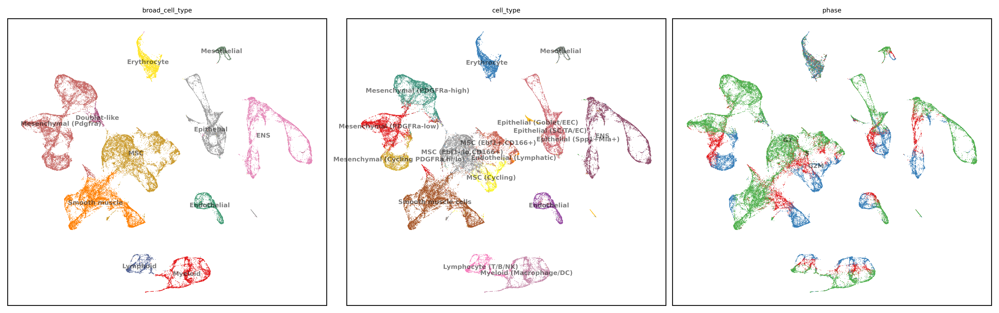

In [6]:
# basis = 'concord_hcl'
basis = 'concord_knn'
show_basis = basis + '_UMAP'
show_cols = ['broad_cell_type', 'cell_type', 'phase']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=6, point_size=1, legend_loc="on data",
    pal=pal,
    save_path=save_dir / f"{file_name}_{show_basis}_embedding.pdf"
)

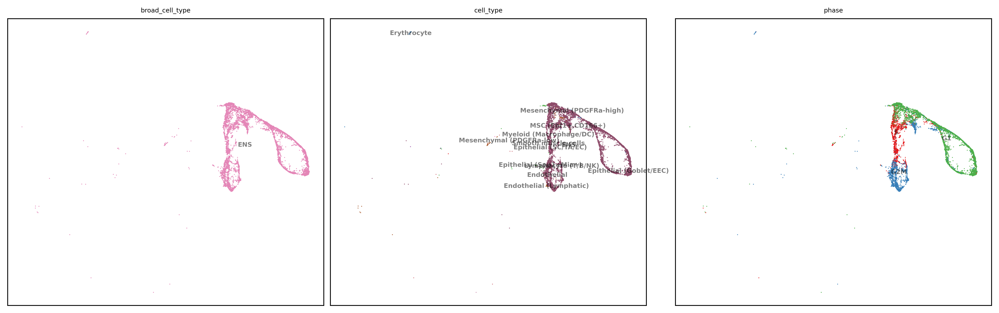

In [7]:
# plot UMAP of the cell subset in the concord_knn embedding
cell_type_subset = 'ENS'
adata_subset = adata[adata.obs['broad_cell_type'] == cell_type_subset].copy()
basis = 'concord_knn'
show_basis = basis + '_UMAP'
show_cols = ['broad_cell_type', 'cell_type', 'phase']       
ccd.pl.plot_embedding(
    adata_subset, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=6, point_size=3, legend_loc="on data",
    pal=pal,
    save_path=save_dir / f"{file_name}_{show_basis}_{cell_type_subset}_embedding.pdf"
)

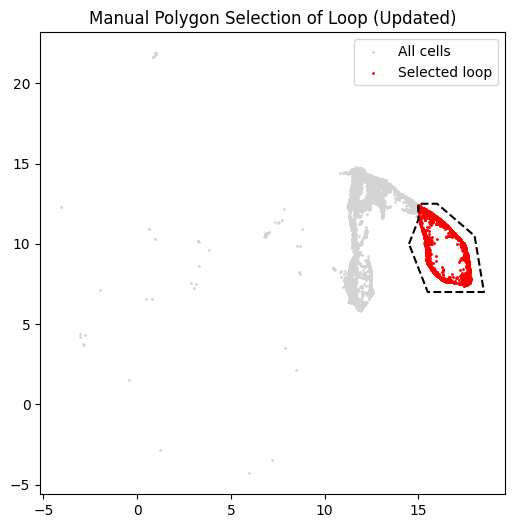

In [15]:
from matplotlib.path import Path
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Coordinates (e.g., UMAP)
X = adata_subset.obsm['concord_knn_UMAP']

# Step 2: Define updated polygon
polygon = np.array([
    [14.5, 10.0],
    [15.0, 11.5],
    [15.0, 12.5],
    [16.0, 12.5],
    [18.0, 10.5],
    [18.5, 7.0],
    [15.5, 7.0],
    [14.5, 10.0]  # closing the loop
])
path = Path(polygon)

# Step 3: Find points inside polygon
mask = path.contains_points(X)
adata_subset_loop = adata_subset[mask].copy()

# Step 4: Plot result
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c='lightgray', s=1, label='All cells')
plt.scatter(X[mask, 0], X[mask, 1], c='red', s=1, label='Selected loop')
plt.plot(polygon[:, 0], polygon[:, 1], 'k--')  # draw loop
plt.legend()
plt.title("Manual Polygon Selection of Loop (Updated)")

# save the selected loop figure in the save directory
plt.savefig(save_dir / f"{file_name}_{cell_type_subset}_loop_selection.pdf", bbox_inches='tight', dpi=300)

plt.show()


In [16]:
# save adata_subset_loop to a h5ad file
adata_subset_loop.write_h5ad(save_dir / f"{file_name}_{cell_type_subset}_loop.h5ad")

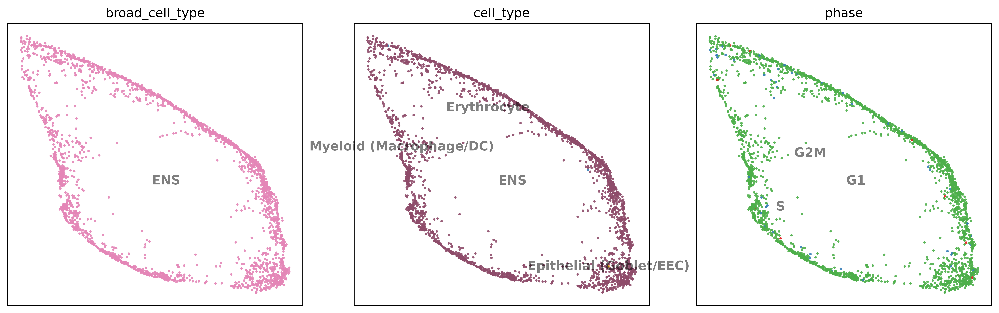

In [17]:
ccd.pl.plot_embedding(
    adata_subset_loop, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=12, point_size=20, legend_loc="on data",
    pal=pal,
    save_path=save_dir / f"{file_name}_{show_basis}_{cell_type_subset}_loop_embedding.pdf",
)

In [18]:
adata_subset_loop.obs['phase'].value_counts()

phase
G1     2575
G2M      63
S        11
Name: count, dtype: int64

In [19]:
# cell_type_subset = 'ENS'
# adata_subset_loop = sc.read_h5ad(save_dir / f"{file_name}_{cell_type_subset}_loop.h5ad")

# order cells by pseudotime

In [20]:
# UMAP coordinates for loop cells
X_loop = adata_subset_loop.obsm['concord_knn_UMAP']

# Step 1: Choose a center — either geometric or manual
center = X_loop.mean(axis=0)  # or set manually like np.array([5.5, 3.0])


In [21]:
# Center the coordinates
X_centered = X_loop - center

# Compute angles (arctangent2 gives full 360°)
angles = np.arctan2(X_centered[:, 1], X_centered[:, 0])  # returns in radians
angles = (angles + 2 * np.pi) % (2 * np.pi)  # convert to [0, 2π] range


In [22]:
# Store in .obs
adata_subset_loop.obs['loop_angle'] = angles

# Optional: order cells by angle (ascending)
adata_subset_loop.obs['loop_order'] = angles.argsort().argsort()  # 0 to N-1


In [23]:
adata_subset_loop

AnnData object with n_obs × n_vars = 2649 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype', 'loop_angle', 'loop_order'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subtype_colors', 'neighbors', 'phase_colors', 'seg_classify_colors'

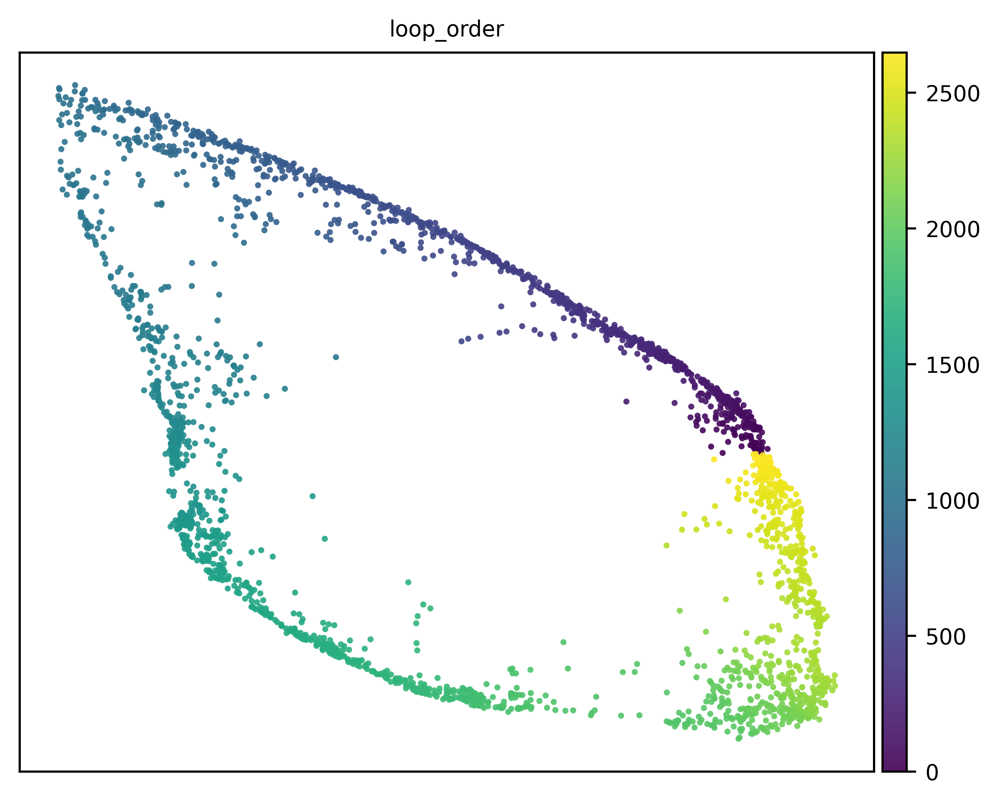

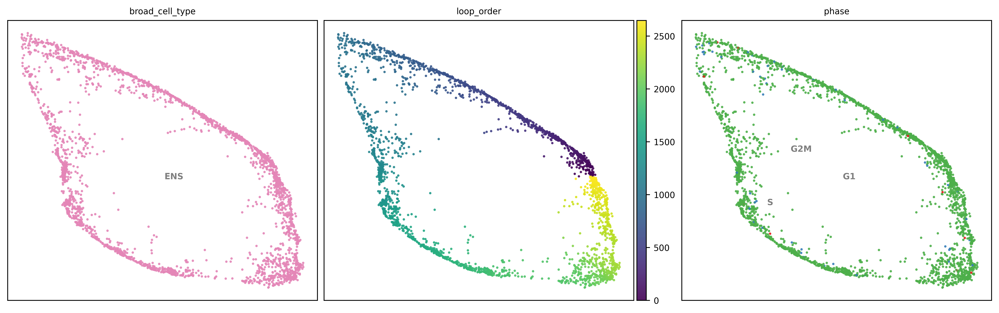

In [24]:
basis = 'concord_knn'
show_basis = basis + '_UMAP'

ccd.pl.plot_embedding(
    adata_subset_loop, show_basis, 
    color_by = ['loop_order'] , 
    figsize=(5,4), dpi=600, ncols=1, point_size=20, 
    pal=pal,
    save_path=save_dir / f"{file_name}_{show_basis}_{cell_type_subset}_loop_ordered_embedding_1.pdf",
)

ccd.pl.plot_embedding(
    adata_subset_loop, show_basis, 
    color_by = ['broad_cell_type', 'loop_order', 'phase'] , 
    figsize=(13,4), dpi=600, ncols=3, point_size=20, 
    pal=pal,
    save_path=save_dir / f"{file_name}_{show_basis}_{cell_type_subset}_loop_ordered_embedding_2.pdf",
)

In [25]:
# Ensure loop_order is numeric
adata_subset_loop.obs['loop_order'] = pd.to_numeric(adata_subset_loop.obs['loop_order'])

# Sort AnnData by loop_order
adata_subset_loop_sorted = adata_subset_loop[adata_subset_loop.obs.sort_values("loop_order").index].copy()


----

In [ ]:
adata_subset_loop

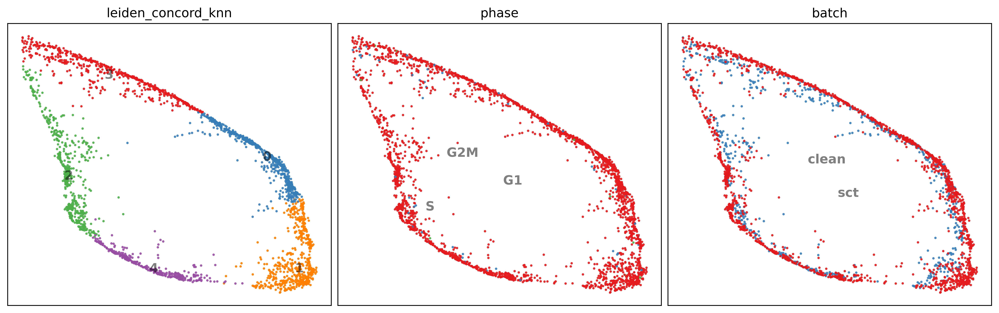

In [26]:
import scanpy as sc

# Step 1: Create a neighbor graph from the latent space you want to use
sc.pp.neighbors(adata_subset_loop, use_rep='concord_knn', n_neighbors=15)

# Step 2: Run Leiden clustering
sc.tl.leiden(adata_subset_loop, resolution=0.2, key_added='leiden_concord_knn')

# Step 3: Plot the Leiden clusters on the UMAP
ccd.pl.plot_embedding(
    adata_subset_loop, 
    show_basis, 
    color_by = ['leiden_concord_knn', 'phase', 'batch'], 
    figsize=(13,4), 
    dpi=600, 
    ncols=3, 
    font_size=12, 
    point_size=20, 
    legend_loc="on data",
    save_path=save_dir / f"{file_name}_{show_basis}_endothelial_loop_leiden_embedding.pdf",
)

In [29]:
# Step 1: Define custom mapping
# Replace keys with original Leiden cluster labels and values with desired labels based on loop_order
leiden_manual_map = {
    '2': 'C1',
    '4': 'C2',
    '1': 'C3',
    '0': 'C4',
    '3': 'C5',
    # ... continue as needed
}

# Step 2: Apply the mapping
adata_subset_loop.obs['leiden_loop_ordered'] = (
    adata_subset_loop.obs['leiden_concord_knn'].map(leiden_manual_map)
)

# Step 3: Set as categorical with order (optional, for plotting consistency)
custom_order = pd.unique(adata_subset_loop.obs['leiden_loop_ordered']).tolist()
custom_order.sort()

adata_subset_loop.obs['leiden_loop_ordered'] = pd.Categorical(
    adata_subset_loop.obs['leiden_loop_ordered'],
    categories=custom_order,
    ordered=True
)

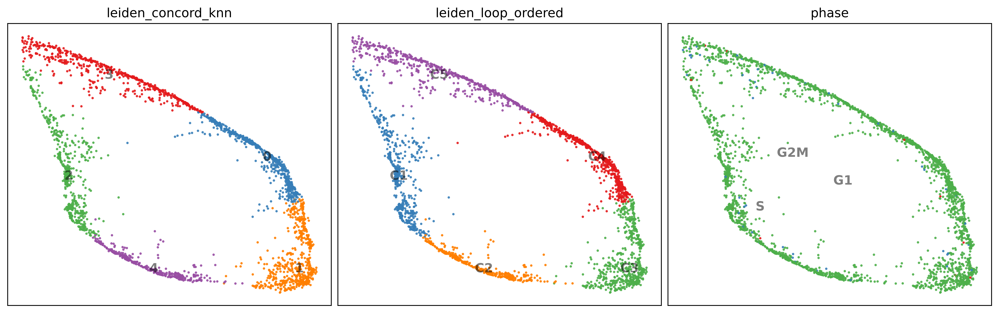

In [30]:
# Step 4: Plot the Leiden clusters on the UMAP
basis = 'concord_knn'
show_basis = basis + '_UMAP'

ccd.pl.plot_embedding(
    adata_subset_loop, 
    show_basis, 
    color_by = ['leiden_concord_knn', 'leiden_loop_ordered', 'phase'], 
    figsize=(13,4), 
    dpi=600, 
    ncols=3, 
    font_size=12, 
    point_size=20, 
    pal=pal,
    legend_loc="on data",
    save_path=save_dir / f"{file_name}_{cell_type_subset}_leiden_clusters.pdf",
)

In [31]:
import scanpy as sc

sc.tl.rank_genes_groups(
    adata_subset_loop, 
    groupby='leiden_loop_ordered', 
    method='wilcoxon', 
    use_raw=False
)


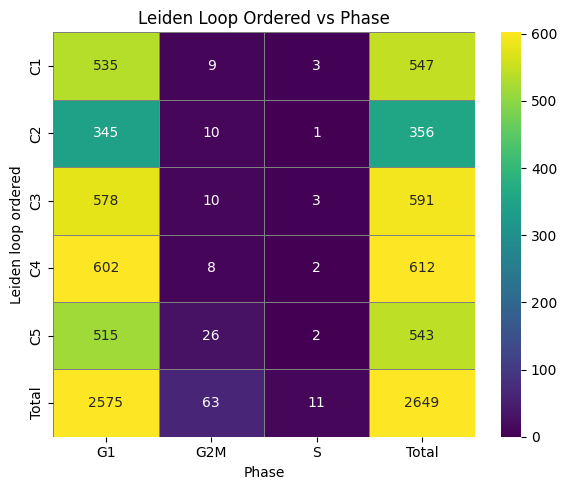

In [32]:
import seaborn as sns, matplotlib.pyplot as plt

# Crosstab with totals
crosstab_df = pd.crosstab(
    adata_subset_loop.obs['leiden_loop_ordered'],
    adata_subset_loop.obs['phase'],
    margins=True, margins_name="Total"
)

# Exclude 'Total' row and column for vmax
crosstab_clean = crosstab_df.drop(index="Total", columns="Total")
vmax_val = crosstab_clean.to_numpy().max()

# Plot full table with fixed color scale
plt.figure(figsize=(6, 5))
sns.heatmap(crosstab_df, annot=True, fmt='d', cmap='viridis', cbar=True,
            linewidths=0.5, linecolor='gray', vmin=0, vmax=vmax_val)
plt.title("Leiden Loop Ordered vs Phase")
plt.ylabel("Leiden loop ordered")
plt.xlabel("Phase")
plt.tight_layout()
plt.savefig(save_dir / f"{file_name}_leiden_phase_crosstab.pdf", dpi=300)
plt.show()
plt.close()


71 top DEGs extracted across leiden_loop_ordered clusters.


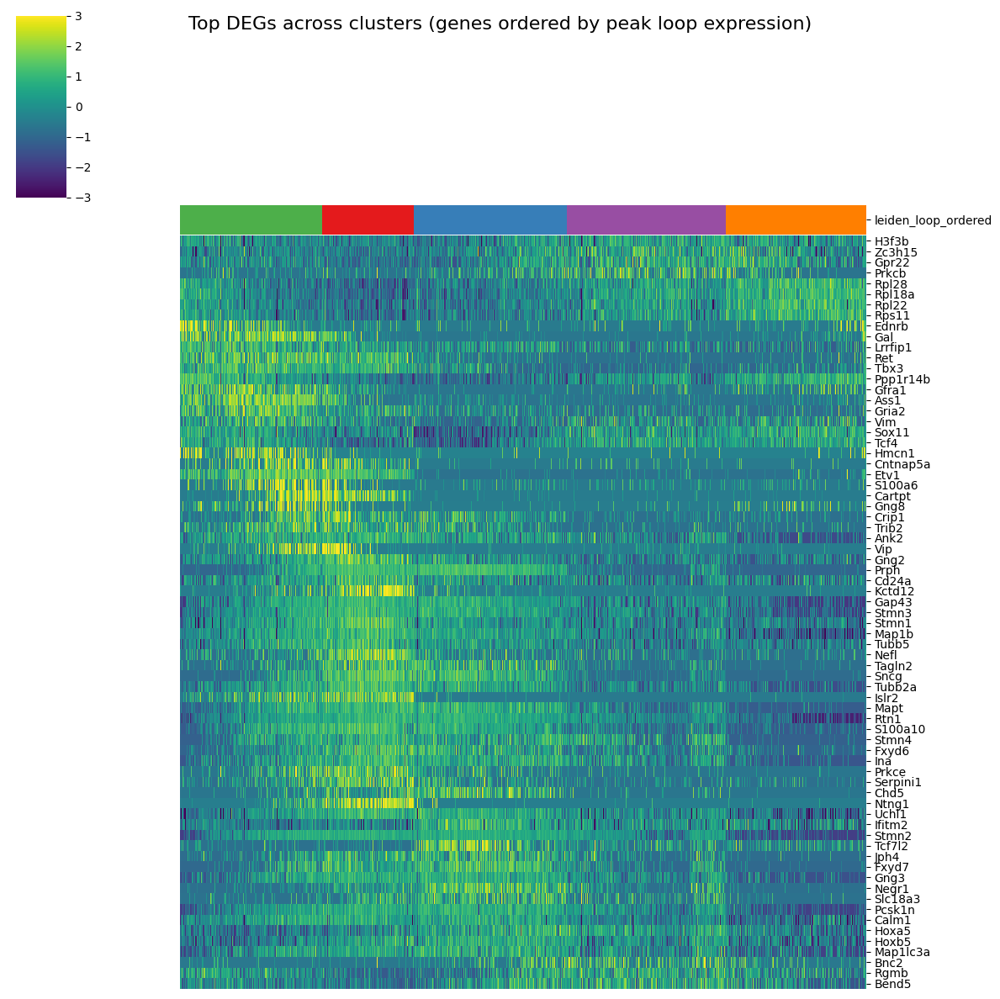

In [33]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract top N DEGs per leiden cluster
degs_df = sc.get.rank_genes_groups_df(adata_subset_loop, group=None)
top_n = 20
top_genes = (
    degs_df
    .groupby("group")
    .apply(lambda x: x.nsmallest(top_n, "pvals_adj"))
    .reset_index(drop=True)["names"]
    .unique()
    .tolist()
)
print(f"{len(top_genes)} top DEGs extracted across leiden_loop_ordered clusters.")

# Step 2: Subset AnnData and compute z-score
adata_degs = adata_subset_loop[:, top_genes].copy()
X = adata_degs.X.toarray() if hasattr(adata_degs.X, "toarray") else adata_degs.X
adata_degs.layers["zscore"] = zscore(X, axis=0)

# Step 3: Order cells by leiden_loop_ordered and loop_order
adata_degs.obs["leiden_order"] = adata_degs.obs["leiden_loop_ordered"].cat.codes
adata_degs.obs["sort_key"] = adata_degs.obs["leiden_order"] + adata_degs.obs["loop_order"] * 1e-4
adata_degs = adata_degs[adata_degs.obs.sort_values("sort_key").index].copy()

# Step 4: Use predefined peak-sorting function on zscore matrix
# Prepare adata_degs.obsm["zscore"] for function input
adata_degs.obsm["zscore"] = adata_degs.layers["zscore"]
loop_path = np.argsort(adata_degs.obs["loop_order"].values)

sorted_data, _, _, sorted_columns = ccd.ul.sort_and_smooth_signal_along_path(
    adata_degs,
    signal_key="zscore",
    path=loop_path,
    sigma=2
)

# Step 5: Reorder genes in AnnData object
adata_degs = adata_degs[:, sorted_columns].copy()

# Step 6: Define palette for clusters
# unique_clusters = adata_degs.obs['leiden_loop_ordered'].cat.categories
# palette = sns.color_palette("tab20", len(unique_clusters))
# pal = {"leiden_loop_ordered": dict(zip(unique_clusters, palette))}

_, _, leiden_loop_ordered_pal = ccd.pl.get_color_mapping(adata_degs, 'leiden_loop_ordered', pal='Set1', seed=seed)

# Step 7: Plot
with plt.rc_context(rc=custom_rc):
    ccd.pl.heatmap_with_annotations(
        adata=adata_degs,
        val="zscore",
        transpose=True,
        obs_keys=["leiden_loop_ordered"],
        pal={"leiden_loop_ordered": leiden_loop_ordered_pal},
        use_clustermap=True,
        cluster_rows=False,
        cluster_cols=False,
        cmap=sns.color_palette("viridis", as_cmap=True),
        row_scale=False,
        clip_limits=(-3, 3),
        rasterize=True,
        title="Top DEGs across clusters (genes ordered by peak loop expression)",
        figsize=(12, 12),
        save_path=save_dir / f"{proj_name}_top_degs_heatmap.pdf",
        show=True
    )


In [34]:
pal = {"cell_type": celltype_pal,
    "broad_cell_type": broad_celltype_pal,
    'phase': phase_pal,
    'leiden_loop_ordered': leiden_loop_ordered_pal}

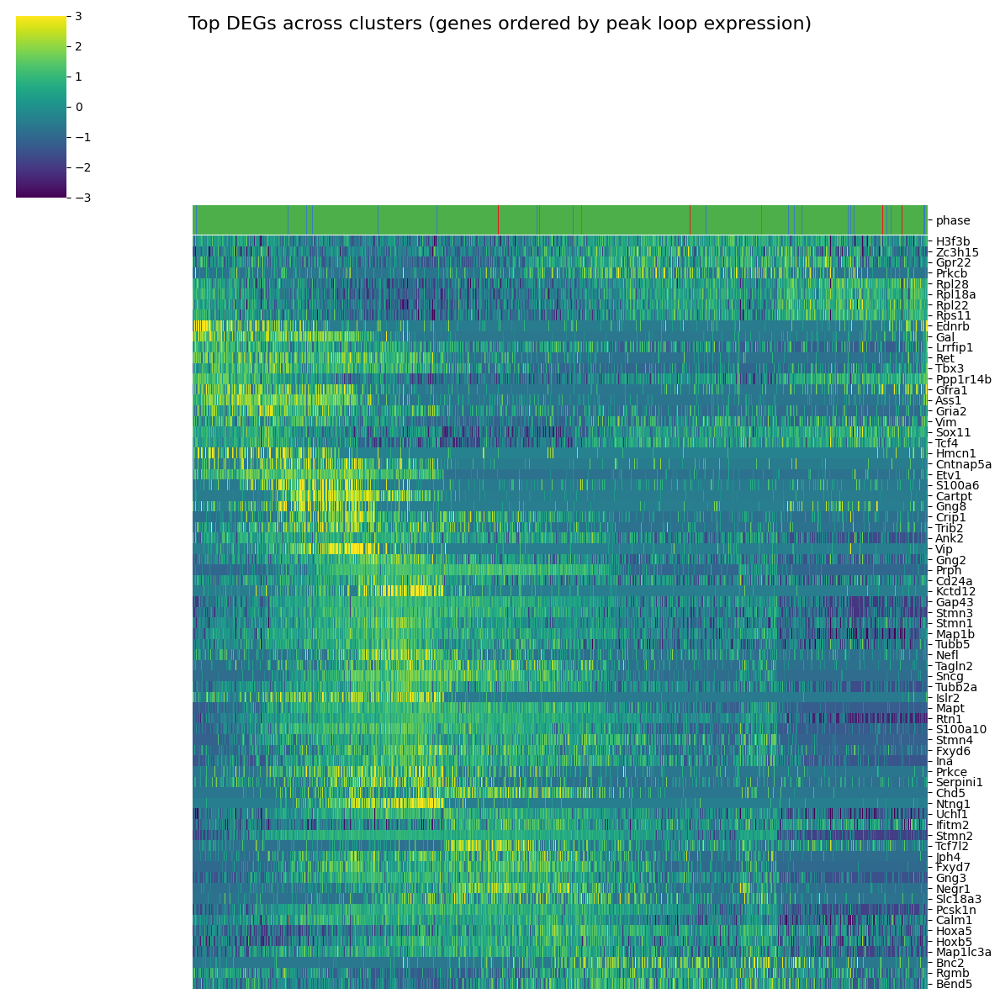

In [35]:
# Step 7: Plot
with plt.rc_context(rc=custom_rc):
    ccd.pl.heatmap_with_annotations(
        adata=adata_degs,
        val="zscore",
        transpose=True,
        obs_keys=["phase"],
        pal={"phase": phase_pal},
        use_clustermap=True,
        cluster_rows=False,
        cluster_cols=False,
        cmap=sns.color_palette("viridis", as_cmap=True),
        row_scale=False,
        clip_limits=(-3, 3),
        rasterize=True,
        title="Top DEGs across clusters (genes ordered by peak loop expression)",
        figsize=(12, 12),
        save_path=save_dir / f"{proj_name}_top_degs_heatmap_3.pdf",
        show=True
    )

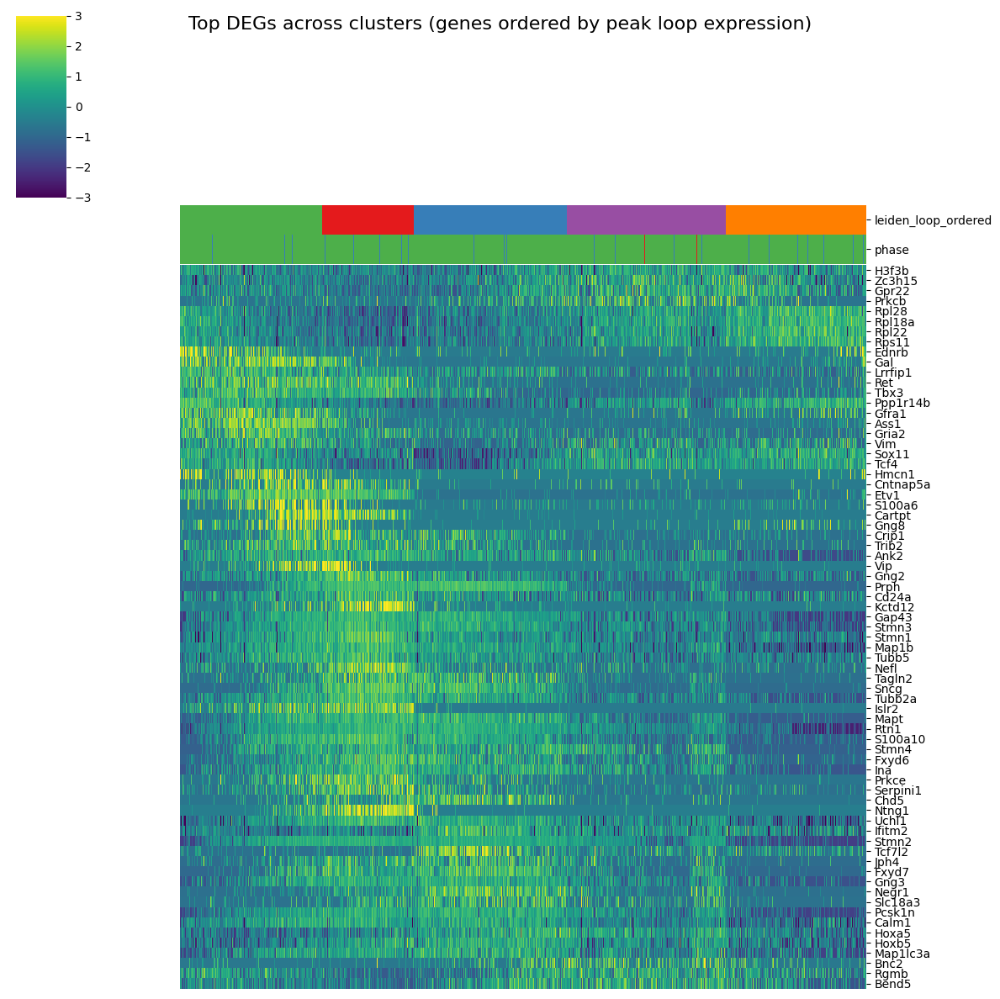

In [36]:
# Step 7: Plot
with plt.rc_context(rc=custom_rc):
    ccd.pl.heatmap_with_annotations(
        adata=adata_degs,
        val="zscore",
        transpose=True,
        obs_keys=["leiden_loop_ordered", "phase"],
        pal={"leiden_loop_ordered": leiden_loop_ordered_pal,
             "phase": phase_pal},
        use_clustermap=True,
        cluster_rows=False,
        cluster_cols=False,
        cmap=sns.color_palette("viridis", as_cmap=True),
        row_scale=False,
        clip_limits=(-3, 3),
        rasterize=True,
        title="Top DEGs across clusters (genes ordered by peak loop expression)",
        figsize=(12, 12),
        save_path=save_dir / f"{proj_name}_top_degs_heatmap_2.pdf",
        show=True
    )

In [37]:
# save the genes into a file
with open(save_dir / f"{proj_name}_top_degs.txt", "w") as f:
    f.write("\n".join(top_genes))
print(f"Top DEGs saved to {save_dir / f'{proj_name}_top_degs.txt'}")


Top DEGs saved to ../save/gut_dev_Huycke-Aug04-0015/gut_dev_Huycke_top_degs.txt


In [38]:
# save the adata to the same h5ad file
adata_subset_loop.write_h5ad(save_dir / f"{file_name}_{cell_type_subset}_loop.h5ad")